In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')


import matplotlib.pyplot as plt
%matplotlib inline


import seaborn as sns

from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score


import statsmodels.api as sm
from statsmodels.formula.api import ols

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn import linear_model as lm
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_columns')

In [2]:
#we decided to save the models as funtions so we could run it easily when testing the multiple hipoteses

def ols(df, target):
    y = df[target]
    X = df.drop(columns=[target])
    X = sm.add_constant(X)
    model = sm.OLS(y,X).fit()

    return print(model.summary())


def split_and_linear_reg_model(df, target):
    X = df.drop(columns=[target])
    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    lm= linear_model.LinearRegression()
    model = lm.fit(X_train, y_train)
    r2 = model.score(X_train, y_train)

    predictions = lm.predict(X_test)
    mae = mean_absolute_error(y_test, predictions)

    comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': predictions})
    comparison_df = comparison_df.head(50)

    print("R2 score is =", round(r2, 2))
    print("Mean Absolute Error is =", mae)

    # Print the DataFrame
    print("Comparison DataFrame:")
    print(comparison_df)

    return r2, mae, comparison_df

def matrix(df):
    matrix = df.corr().round(2)
    mask = np.triu(np.ones_like(matrix, dtype=bool))
    fig, ax = plt.subplots(figsize=(80, 80))
    ax = sns.heatmap(matrix, annot=True, vmax=1, vmin=-1, center=0, cmap='vlag', mask=mask)
    plt.show()


In [3]:
#data_train = pd.read_csv(r"/content/FIFA_TRAIN_DATA.CSV", sep="?")
#data_test = pd.read_csv(r"/content/FIFA_TEST_DATA.CSV", sep="?")

data_train = pd.read_csv(r"C:\Users\Quaresma\Documents\IRONHACK\FIFA PROJECT\FIFA_TRAIN_DATA.CSV", sep="?")
data_test = pd.read_csv(r"C:\Users\Quaresma\Documents\IRONHACK\FIFA PROJECT\FIFA_TEST_DATA.CSV", sep="?")

# New Section

In [4]:
#standardizing the columns on both data frames so they are organized the same way
col=[data_test.columns[i].lower().replace(" ","_") for i in range(len(data_test.columns))]
data_test.columns=col
col1=[data_train.columns[i].lower().replace(" ","_") for i in range(len(data_train.columns))]
data_train.columns=col1


In [5]:
#visualizing the Data frames
data_train.columns
data_test.columns
data_train.info

data_train.shape
data_test.shape

(3425, 105)

In [6]:
#Visualize the data according to their mean, median std dev and counts.
#save it has a df in case we need later
data_train_describe = data_train.describe().T
data_test_describe= data_test.describe().T
#data_train_describe


In [7]:
#dropcolumns from data train and test, these columns seem irrelevant for the aquisition of a player so we droped them on our first evaluation, some of them had a lot of null values as well
# the bov and pot columns are not on the data_test df so we have to eliminate them they wont have meaning building the model.
data_train= data_train.drop(['unnamed:_0','player_photo','club_logo','flag_photo','gender','joined',"id", 'team_&_contract', 'loan_date_end', 'contract','position', 'bov', 'pot' ], axis=1)
data_test= data_test.drop(['unnamed:_0','player_photo','club_logo','flag_photo','gender','joined',"id", 'team_&_contract', 'loan_date_end', 'contract','position' ], axis=1)


In [8]:
#just to vizualize all the columns we have so far on the test df and the train df
data_train.head()
data_test.head()


,name,age,nationality,club,bp,height,weight,foot,growth,value,wage,release_clause,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,G. Borrelli,19,Italy,Pescara,ST,"6'4""",198lbs,Right,15,€325K,€600,€707K,247,26,61,66,44,50.0,188,53,28.0,23,31,53,246,48,55,49.0,49,45.0,292,58,62.0,44,80,48,227,44,21.0,66.0,41.0,55,45.0,53,18,20,15.0,54,12,14,7,7,14,1307,284,2 ★,2★,Medium,Low,1 ★,52,57,36,52,24,63,4,58+2,58+2,58+2,50+0,54+0,54+0,54+0,50+0,50+2,50+2,50+2,48+2,44+2,44+2,44+2,48+2,34+2,35+2,35+2,35+2,34+2,34+2,38+2,38+2,38+2,34+2,16+2
1,N. Boujellab,21,Morocco,FC Schalke 04,CAM,"6'0""",159lbs,Right,12,€975K,€5K,€1.9M,274,50,58,49,65,52.0,313,75,54.0,55,59,70,353,71,68,77.0,62,75.0,267,58,52.0,59,47,51,272,58,38.0,56.0,61.0,59,58.0,160,55,54,51.0,54,15,15,7,10,7,1693,359,4 ★,3★,Medium,Medium,1 ★,69,56,59,73,50,52,33,60+2,60+2,60+2,64+0,64+0,64+0,64+0,64+0,65+2,65+2,65+2,64+2,61+2,61+2,61+2,64+2,57+2,56+2,56+2,56+2,57+2,56+2,53+2,53+2,53+2,56+2,17+2
2,A. Wahab Ibrahim,21,Ghana,Famalicão,LB,"5'11""",159lbs,Left,8,€400K,€1K,€920K,246,60,32,54,59,41.0,247,58,37.0,41,52,59,326,69,76,62.0,56,63.0,256,40,56.0,61,69,30,251,53,57.0,51.0,49.0,41,52.0,176,55,60,61.0,42,7,14,9,5,7,1544,341,2 ★,2★,Medium,Medium,1 ★,73,35,54,59,57,63,4,51+2,51+2,51+2,55+0,53+0,53+0,53+0,55+0,54+2,54+2,54+2,57+2,54+2,54+2,54+2,57+2,60+2,57+2,57+2,57+2,60+2,60+2,59+2,59+2,59+2,60+2,14+2
3,A. Gabr,29,Egypt,Egypt,CB,"6'3""",194lbs,Right,0,€0,€0,€0,214,34,25,63,59,33.0,208,42,34.0,22,66,44,305,65,62,63.0,55,60.0,308,56,66.0,66,78,42,211,67,63.0,22.0,35.0,24,65.0,218,72,71,75.0,50,14,7,14,8,7,1514,332,2 ★,2★,Medium,Medium,1 ★,63,35,47,46,69,72,4,45+1,45+1,45+1,44+0,43+0,43+0,43+0,44+0,45+1,45+1,45+1,46+1,51+1,51+1,51+1,46+1,59+1,63+1,63+1,63+1,59+1,62+1,67+1,67+1,67+1,62+1,14+1
4,N. Domínguez,30,Argentina,Racing Club,CDM,"6'0""",157lbs,Right,0,€6M,€17K,€8.4M,313,62,61,68,79,43.0,331,67,50.0,56,81,77,309,56,54,64.0,75,60.0,372,77,71.0,79,76,69,340,69,79.0,56.0,81.0,55,75.0,238,79,78,81.0,67,15,13,12,11,16,1970,416,3 ★,3★,Medium,Medium,1 ★,55,64,74,70,78,75,17,67+2,67+2,67+2,67+0,69+0,69+0,69+0,67+0,71+2,71+2,71+2,69+2,76+0,76+0,76+0,69+2,74+2,78+-2,78+-2,78+-2,74+2,74+2,76+0,76+0,76+0,74+2,20+2


In [9]:
#vizualizing just the columns on both dataframes
data_train.columns[:100]
data_train.columns[101:]
data_test.columns[:100]
data_test.columns[101:]


Index([], dtype='object')

In [10]:
#check the data types on both data frames to start dealing with the categorical and numerical numbers
data_train.dtypes
data_test.dtypes

name           object
age             int64
nationality    object
club           object
bp             object
                ...  
lcb            object
cb             object
rcb            object
rb             object
gk             object
Length: 94, dtype: object

In [11]:
#Missing Values Visualization
#fig = plt.figure(figsize=(15,7))
#sns.heatmap(data_train.isna(), yticklabels=False,cmap='YlGnBu')

In [12]:
#check the percentage of null values
x=data_train.isna().sum() / len(data_train)
x.sort_values(ascending=False)

y=data_test.isna().sum() / len(data_test)
y.sort_values(ascending=False)

composure     0.027445
d/w           0.006423
a/w           0.006423
vision        0.004088
balance       0.004088
                ...   
stamina       0.000000
shot_power    0.000000
power         0.000000
reactions     0.000000
gk            0.000000
Length: 94, dtype: float64

In [13]:
# since on both data frames the % of null values ir above 6% we decided to drop all the null values, it wont affect our results, most of these null values we eliminated by droping the first set of columns.
data_train= data_train.dropna()
data_test= data_test.dropna()

In [14]:
#Dealing with the categorical values height and weight
#tranforming height in numerical cm and weight to numeric value

data_train['ht_in_ft']=pd.to_numeric(data_train['height'].str[0])
data_train['ht_in_in']=pd.to_numeric(data_train['height'].str.split("\'").str[1].str.strip('"'))
data_train['height2']=(data_train['ht_in_ft']*12+data_train['ht_in_in'])*2.54
data_train['weight2']=pd.to_numeric(data_train['weight'].str.strip('lbs'))
data_train['weight2']=np.round(data_train['weight2'].values * 0.45359237, 2)


data_test['ht_in_ft']=pd.to_numeric(data_test['height'].str[0])
data_test['ht_in_in']=pd.to_numeric(data_test['height'].str.split("\'").str[1].str.strip('"'))
data_test['height2']=(data_test['ht_in_ft']*12+data_test['ht_in_in'])*2.54
data_test['weight2']=pd.to_numeric(data_test['weight'].str.strip('lbs'))
data_test['weight2']=np.round(data_test['weight2'].values * 0.45359237, 2)

#droping the columns that we dont need anymore and kkep just the new columns of heigth2 and weight2
data_train = data_train.drop(['ht_in_ft','ht_in_in', 'height', 'weight'], axis=1)
data_test = data_test.drop(['ht_in_ft','ht_in_in', 'height', 'weight'], axis=1)

#Dealing with the categorical values of 'value' and 'wage'
#eliminate the the 'K' and 'M' and turning them in millions and thousands, and eliminate the '€' so we can turn these into numerical values.
data = [ 'value', 'wage', 'release_clause']

for x in data:
    data_train[x] = data_train[x].replace({'K': '*1e3', 'M': '*1e6', '€':''}, regex=True).map(pd.eval).astype(int)
    data_test[x] = data_test[x].replace({'K': '*1e3', 'M': '*1e6', '€':''}, regex=True).map(pd.eval).astype(int)
    
#Dealing with the categorical data 'hits' the same way we dealt with the feature 'value' and 'wage'
data_train['hits'] = data_train['hits'].apply(lambda a: a if "K" not in str(a) else str(a).replace('K', '*1e3')).map(pd.eval).astype(int)
data_test['hits'] = data_test['hits'].apply(lambda a: a if "K" not in str(a) else str(a).replace('K', '*1e3')).map(pd.eval).astype(int)

#Dealing with categorical features thet represent the scoring on each field position
#Since the extra value "+" wont affect our results, because it is a increase or not in the potencial, we decided to just eliminate de values and keep just the score.
#data = [ 'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf',
#       'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm',
#       'cdm', 'rdm', 'gk', 'rwb',	'lb', 'lcb',	'cb',	'rcb', 'rb']

#for x in data:
#    data_test[x] = data_test[x].str.split('+').str[0]
#    data_test[x] = data_test[x].astype(int)
#    data_train[x] = data_train[x].str.split('+').str[0]
#    data_train[x] = data_train[x].astype(int)
    
    
#Dealing with the categorical feature 'w/f, 'ir', 'sm' these features are typed as categoricla because fo the star, so we are eliminating this star by replacing it with nothing and turning it into numericla values.
star = ['w/f','ir', 'sm']

for x in star:
    data_train[x] = data_train[x].str.replace('[^\d.]', '', regex=True).astype(int)
    data_test[x] = data_test[x].str.replace('[^\d.]', '', regex=True).astype(int)

lmh = ['a/w','d/w']
for x in lmh:
    data_train[x] = data_train[x].replace({'Medium':'2', 'Low': '1','High': '3'}, regex=True).astype(int)
    data_test[x] = data_test[x].replace({'Medium':'2', 'Low': '1','High': '3'}, regex=True).astype(int)

In [15]:
#Dealing with the categorical feature 'nationality', check which are the unique values of this feature, and how many different there are.
data_train['nationality'].nunique()
data_train['nationality'].unique()

array(['Spain', 'Turkey', 'Republic of Ireland', 'Italy', 'Germany',
       'Portugal', 'England', 'Brazil', 'Netherlands', 'Czech Republic',
       'Scotland', 'United States', 'France', 'Wales', 'Ivory Coast',
       'Chile', 'Paraguay', 'Mexico', 'Japan', 'Sweden', 'Nigeria',
       'Belarus', 'Congo', 'Norway', 'Belgium', 'Argentina', 'Denmark',
       'Switzerland', 'South Africa', 'Australia', 'Northern Ireland',
       'Togo', 'Jamaica', 'Poland', 'Austria', 'Cameroon', 'Ghana',
       'Iceland', 'Morocco', 'Korea Republic', 'North Macedonia',
       'Greece', 'Senegal', 'Slovenia', 'Uruguay', 'Madagascar', 'Kosovo',
       'Estonia', 'Bosnia Herzegovina', 'Ukraine', 'Russia', 'Romania',
       'Croatia', 'Bulgaria', 'Finland', 'Antigua &amp; Barbuda',
       'Algeria', 'Peru', 'China PR', 'Trinidad &amp; Tobago',
       'Burkina Faso', 'Panama', 'Gibraltar', 'Colombia', 'Venezuela',
       'Serbia', 'Benin', 'Israel', 'Cyprus', 'Haiti', 'Slovakia',
       'Ecuador', 'Saudi Arab

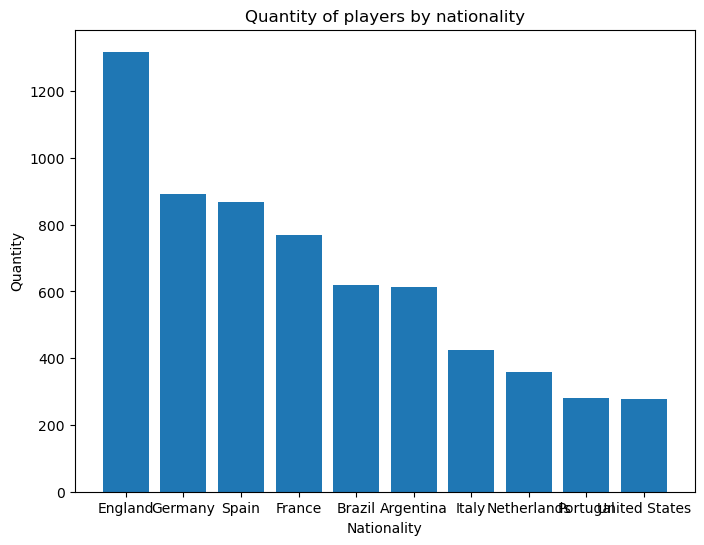

In [16]:
#to get  a better visualizating of the most commong countries in this data frame wer plotted them
cat = data_train['nationality'].value_counts().reset_index()
cat.columns = ['nationality', 'quantity']
ten=cat.head(10)
# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(ten['nationality'], ten['quantity'])
plt.xlabel('Nationality')
plt.ylabel('Quantity')
plt.title('Quantity of players by nationality')
plt.show()

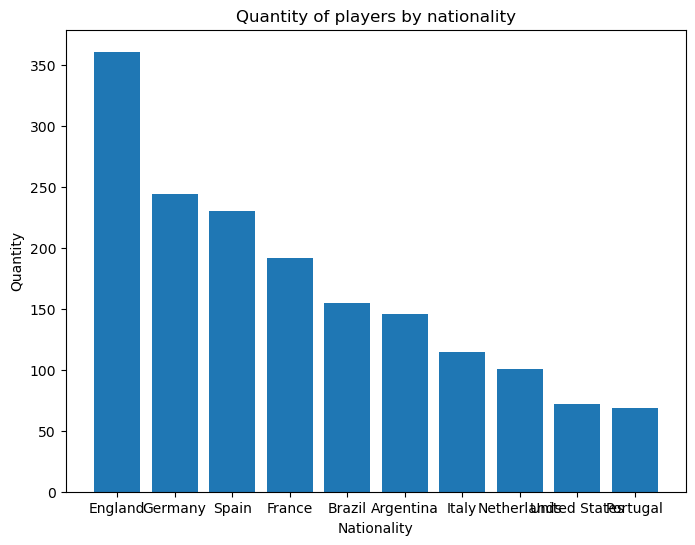

In [17]:
#we did the same foor the data test and verified the first 8 most common country are the same in both data frames
cat = data_test['nationality'].value_counts().reset_index()
cat.columns = ['nationality', 'quantity']
ten=cat.head(10)
# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(ten['nationality'], ten['quantity'])
plt.xlabel('Nationality')
plt.ylabel('Quantity')
plt.title('Quantity of players by nationality')
plt.show()

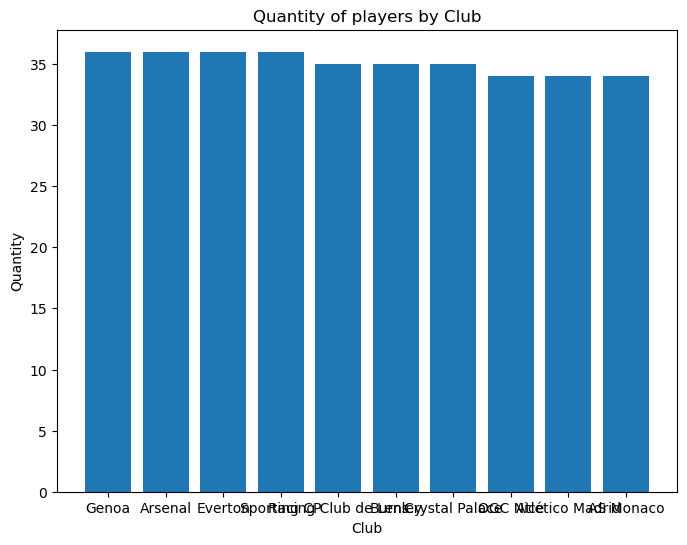

In [18]:
#Dealing with the categorical feature in the data_train, 'club', the same way as the 'nationality' feature
cat = data_train['club'].value_counts().reset_index()
cat.columns = ['club', 'quantity']
ten=cat.head(10)
# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(ten['club'], ten['quantity'])
plt.xlabel('Club')
plt.ylabel('Quantity')
plt.title('Quantity of players by Club')
plt.show()

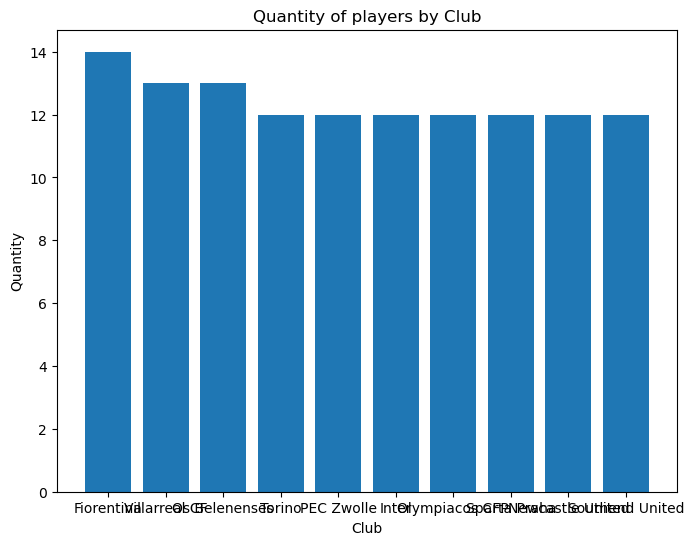

In [19]:
# DEaling with the categorical feature 'club', in the df data_test
#here we can see the most common club are not the same as the the ones in the data_train

cat = data_test['club'].value_counts().reset_index()
cat.columns = ['club', 'quantity']
ten=cat.head(10)
# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(ten['club'], ten['quantity'])
plt.xlabel('Club')
plt.ylabel('Quantity')
plt.title('Quantity of players by Club')
plt.show()

In [20]:
#HEre we are grouping the nationalities of both df by major country, which is england replacing it by number 1 and by minor country which includes all the other countries where the amount of players are less and replacing it with the number '0'
#transform it in numerical features
data_train['major_country']=np.where(data_train['nationality']== 'England',1,0).astype(int)
data_test['major_country']=np.where(data_test['nationality']== 'England',1,0).astype(int)
data_train['minor_country']=np.where(data_train['nationality']== 'England',0,1).astype(int)
data_test['minor_country']=np.where(data_test['nationality']== 'England',0,1).astype(int)

#after this we decided to drop this feature because????

data_train=data_train.drop(columns=['nationality'])
data_test=data_test.drop(columns=['nationality'])

In [21]:
#checking for more categorical features
pd.set_option('display.max_rows', None)
data_train.dtypes

#we still have 'club', 'name', there are the names of the players and will not be dealt with, 'bp', that stands for best position, 'foot'.
# the best position is a categorical feature staht has a lot of unique values, we are only going to use it to show the results at the presentation

name                 object
age                   int64
ova                   int64
club                 object
bp                   object
foot                 object
growth                int64
value                 int32
wage                  int32
release_clause        int32
attacking             int64
crossing              int64
finishing             int64
heading_accuracy      int64
short_passing         int64
volleys             float64
skill                 int64
dribbling             int64
curve               float64
fk_accuracy           int64
long_passing          int64
ball_control          int64
movement              int64
acceleration          int64
sprint_speed          int64
agility             float64
reactions             int64
balance             float64
power                 int64
shot_power            int64
jumping             float64
stamina               int64
strength              int64
long_shots            int64
mentality             int64
aggression          

In [22]:
#Dealing with the categorical feature foot, we are just going to do a hot encoding on the feature, so we have it as '0's and '1's, which are numerical values
data_train = pd.get_dummies(data_train, columns=['foot'])
data_test = pd.get_dummies(data_test, columns=['foot'])


MODEL

<Axes: title={'center': 'Overall'}, xlabel='ova', ylabel='Density'>

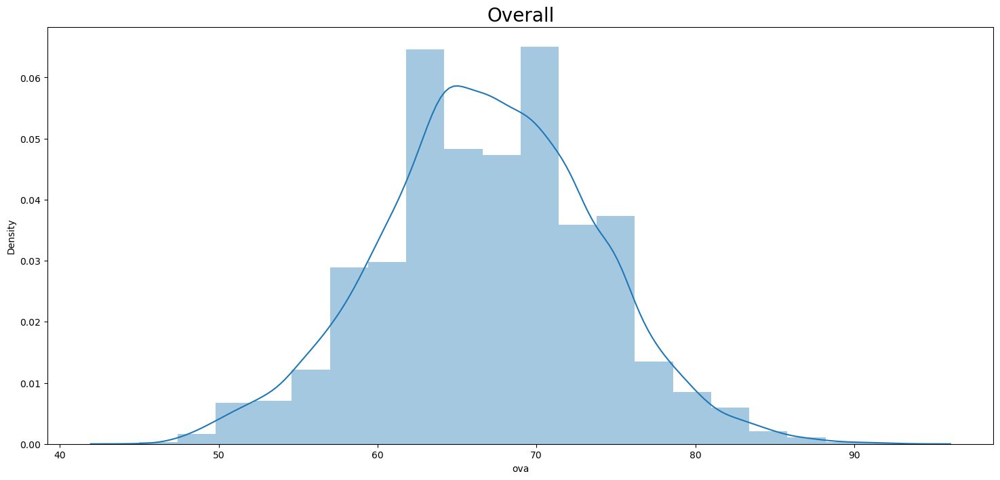

In [23]:
#SINCE WE WANT TO PREDICT THE BEST 3 PLAYERS BASED ON THE OVERALL WE SHOULD STRICT THE DATASET ONLY TO THE BEST PLAYERS DEFINING
plt.figure(figsize=(18,8))
plt.title('Overall', fontsize=20)
sns.distplot(a=data_train['ova'], kde=True, bins=20)

In [24]:
#sorting the 'ova' values in an ascending order and save the the 3000 (aproximately 20% of the data_frame), we decied to do this because we wnat to predict the 'ova' value on the data_test df and find the best players, so to increase the accuracy of our model we are giving him only the best players on the train data.
data_top= data_train.sort_values("ova",ascending=False).reset_index(drop=True)
data_top= data_top[:200]

In [25]:
#To train the model we will just use the numerical data, for now on we will only use the numerical data
numerical = data_top.select_dtypes(include=np.number)
numerical.shape
numerical_test = data_test.select_dtypes(include=np.number)
categorical_test = data_test.select_dtypes(include=np.object)
numerical1=numerical.drop(['ova'],axis=1)

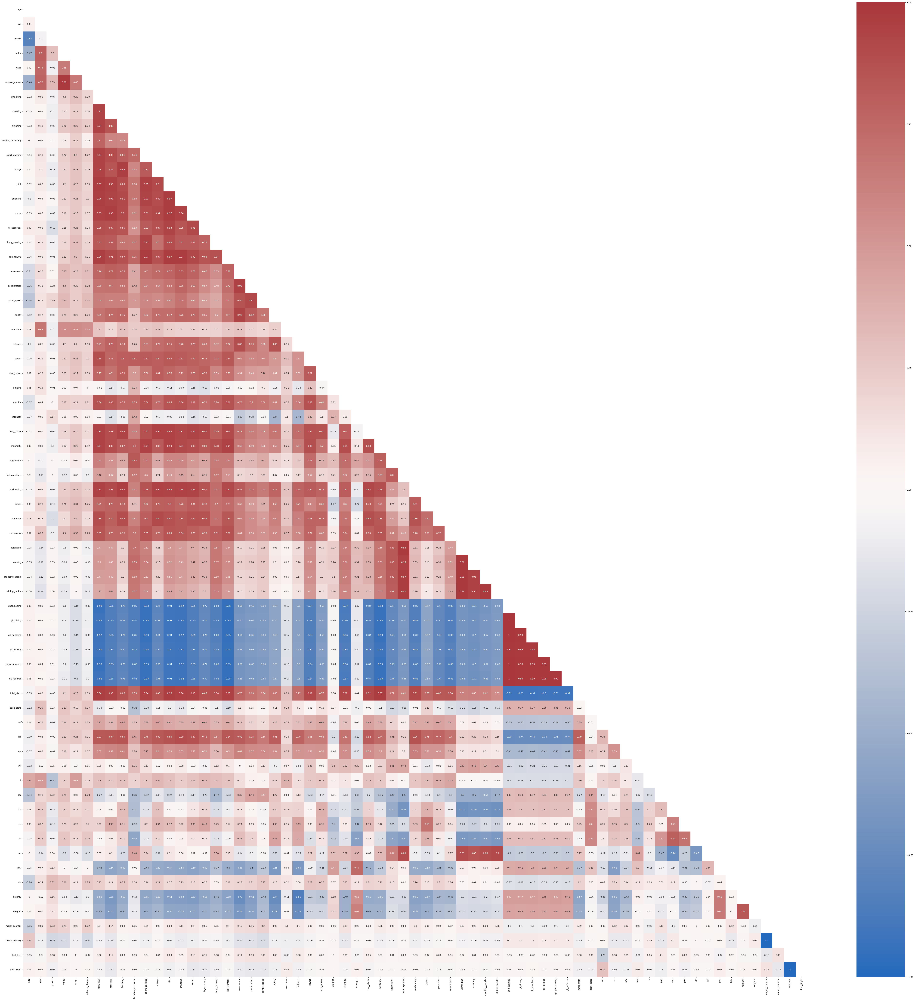

In [26]:
matrix(numerical)

In [27]:
#using the function to do the first model, most of the columns are still on the data frame
xcols = []
ycols = []
correlation = []
max_abs_correlation = 0.7
for x in range(len(numerical1.columns)):
    for y in range(len(numerical1.corr())):
        if x != y:
            xcol = numerical1.columns[x]
            ycol = numerical1.columns[y]
            if xcol in numerical1.columns and ycol in numerical1.columns:
                r = numerical1[xcol].corr(numerical1[ycol])
                correlation.append(r)
                xcols.append(xcol)
                ycols.append(ycol)

dropped_cols = set()
counter = 0
for i in range(len(correlation)):
    if correlation[i] > abs(max_abs_correlation):
        xcol = xcols[i]
        ycol = ycols[i]
        if xcol in numerical1.columns and ycol in numerical1.columns:
            print(xcol, 'and', ycol, 'have a correlation of', correlation[i])
            counter += 1
            # drop one of the columns with high correlation
            if xcol not in dropped_cols and ycol not in dropped_cols:
                if numerical1[xcol].std() > numerical1[ycol].std():
                    numerical1 = numerical1.drop([ycol], axis=1)
                    dropped_cols.add(ycol)
                else:
                    numerical1 = numerical1.drop([xcol], axis=1)
                    dropped_cols.add(xcol)
    else:
        pass

if counter == 0:
    print('No correlation higher than',max_abs_correlation, 'was found.')
else:
    print(counter,'correlations higher than 0.7 were found.', len(dropped_cols), 'columns were dropped.')

print('Maximum correlation is',max(correlation))



value and release_clause have a correlation of 0.978056889136037
attacking and crossing have a correlation of 0.9271693600409787
attacking and finishing have a correlation of 0.9371724103645476
attacking and heading_accuracy have a correlation of 0.7703660920570449
attacking and short_passing have a correlation of 0.9377027564263039
attacking and volleys have a correlation of 0.9394538345809098
attacking and skill have a correlation of 0.968001968208598
skill and dribbling have a correlation of 0.969938117179141
skill and curve have a correlation of 0.9729530361384395
skill and fk_accuracy have a correlation of 0.929606488444374
skill and long_passing have a correlation of 0.8923557312990514
skill and ball_control have a correlation of 0.9727307551374765
skill and movement have a correlation of 0.7676690822228159
skill and agility have a correlation of 0.7171129173797827
skill and balance have a correlation of 0.7522348057314615
skill and power have a correlation of 0.8321813252374837


In [28]:
numerical1.columns

Index(['age', 'growth', 'wage', 'release_clause', 'acceleration', 'reactions',
       'jumping', 'strength', 'defending', 'goalkeeping', 'total_stats',
       'base_stats', 'w/f', 'a/w', 'd/w', 'ir', 'pac', 'sho', 'pas', 'hits',
       'weight2', 'major_country', 'minor_country', 'foot_Left', 'foot_Right'],
      dtype='object')

In [29]:
#add 'ova'
numerical=numerical[['age', 'growth', 'wage', 'release_clause', 'acceleration', 'reactions',
       'jumping', 'strength', 'defending', 'goalkeeping', 'total_stats',
       'base_stats', 'w/f', 'a/w', 'd/w', 'ir', 'pac', 'sho', 'pas', 'hits',
       'weight2', 'major_country', 'minor_country', 'foot_Left', 'foot_Right','ova']]

In [30]:
split_and_linear_reg_model(numerical, 'ova')

R2 score is = 0.9
Mean Absolute Error is = 0.4795270882811966
Comparison DataFrame:
     Actual  Predicted
95       84  84.426845
15       88  88.988433
30       87  87.301726
158      83  84.186219
128      83  82.628263
115      83  82.397929
69       85  84.566846
170      83  83.151183
174      82  81.783319
45       86  87.055324
66       85  85.710058
182      82  82.177186
165      83  82.813885
78       85  84.292536
186      82  82.864215
177      82  82.133159
56       85  84.571067
152      83  83.285220
82       84  83.917300
68       85  85.481277
124      83  83.464917
16       88  86.923594
148      83  83.414009
93       84  83.987898
65       85  85.385927
60       85  84.475376
84       84  84.431065
67       85  85.382143
125      83  82.796200
132      83  83.510392
9        89  88.724593
18       88  88.123104
55       85  84.259601
75       85  84.307199
150      83  82.910541
104      84  82.985538
135      83  83.853332
137      83  84.045536
164      83  82.862

(0.9036650130028809,
 0.4795270882811966,
      Actual  Predicted
 95       84  84.426845
 15       88  88.988433
 30       87  87.301726
 158      83  84.186219
 128      83  82.628263
 115      83  82.397929
 69       85  84.566846
 170      83  83.151183
 174      82  81.783319
 45       86  87.055324
 66       85  85.710058
 182      82  82.177186
 165      83  82.813885
 78       85  84.292536
 186      82  82.864215
 177      82  82.133159
 56       85  84.571067
 152      83  83.285220
 82       84  83.917300
 68       85  85.481277
 124      83  83.464917
 16       88  86.923594
 148      83  83.414009
 93       84  83.987898
 65       85  85.385927
 60       85  84.475376
 84       84  84.431065
 67       85  85.382143
 125      83  82.796200
 132      83  83.510392
 9        89  88.724593
 18       88  88.123104
 55       85  84.259601
 75       85  84.307199
 150      83  82.910541
 104      84  82.985538
 135      83  83.853332
 137      83  84.045536
 164      83  82.86293

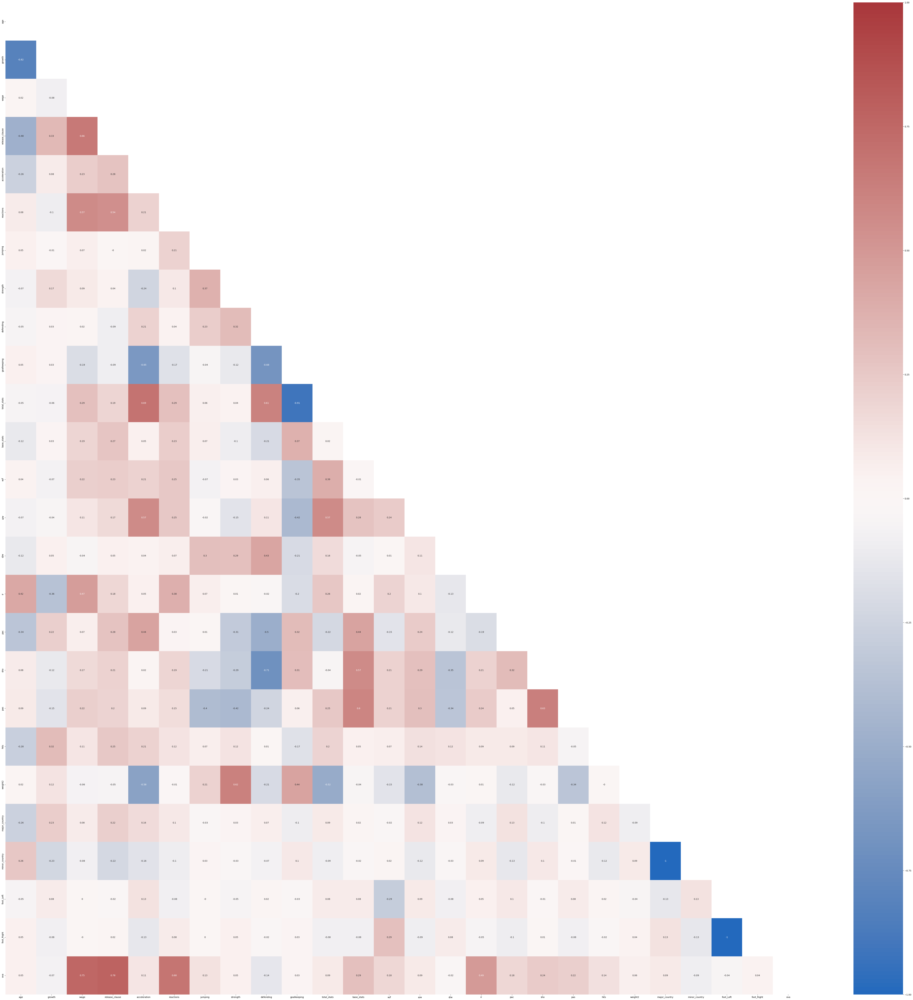

                            OLS Regression Results                            
Dep. Variable:                    ova   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                     72.68
Date:                Sun, 29 Oct 2023   Prob (F-statistic):           2.08e-77
Time:                        00:07:44   Log-Likelihood:                -211.37
No. Observations:                 200   AIC:                             470.7
Df Residuals:                     176   BIC:                             549.9
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             30.4136      1.198     25.

In [31]:
matrix(numerical)
ols(numerical, 'ova')

In [32]:

#the test dataset needs to have the same columns
numerical_test= numerical_test[['age', 'growth', 'wage', 'release_clause', 'acceleration', 'reactions',
       'jumping', 'strength', 'defending', 'goalkeeping', 'total_stats',
       'base_stats', 'w/f', 'a/w', 'd/w', 'ir', 'pac', 'sho', 'pas', 'hits',
       'weight2', 'major_country', 'minor_country', 'foot_Left', 'foot_Right']]

In [34]:
numerical_test.head()

,age,growth,wage,release_clause,acceleration,reactions,jumping,strength,defending,goalkeeping,total_stats,base_stats,w/f,a/w,d/w,ir,pac,sho,pas,hits,weight2,major_country,minor_country,foot_Left,foot_Right
0,19,15,600,707000,48,49,62.0,80,53,54,1307,284,2,2,1,1,52,57,36,4,89.81,0,1,0,1
1,21,12,5000,1900000,71,62,52.0,47,160,54,1693,359,4,2,2,1,69,56,59,33,72.12,0,1,0,1
2,21,8,1000,920000,69,56,56.0,69,176,42,1544,341,2,2,2,1,73,35,54,4,72.12,0,1,1,0
3,29,0,0,0,65,55,66.0,78,218,50,1514,332,2,2,2,1,63,35,47,4,88.00,0,1,0,1
4,30,0,17000,8400000,56,75,71.0,76,238,67,1970,416,3,2,2,1,55,64,74,17,71.21,0,1,0,1


In [35]:
apply the model to the test dataset to get the prediction
X = numerical.drop(['ova'],axis=1)
y = numerical['ova']


lm= linear_model.LinearRegression()
model = lm.fit(X, y)
r2 = model.score(X, y)

predictions = lm.predict(numerical_test)

In [36]:
df = pd.DataFrame(predictions)
df

,0
0,74.967956
1,76.769489
2,76.295701
3,78.234154
4,79.912839
5,76.003650
6,76.313569
7,77.889082
8,76.316199
9,76.424544


In [37]:
df = pd.DataFrame(predictions)
numerical_test['ova_pred']=pd.DataFrame(predictions)
valor= numerical_test.sort_values("ova_pred",ascending=False)
valor
df_final=pd.merge(categorical_test,valor,left_index=True, right_index=True)
df_final.sort_values("ova_pred",ascending=False)

,name,club,bp,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,age,growth,wage,release_clause,acceleration,reactions,jumping,strength,defending,goalkeeping,total_stats,base_stats,w/f,a/w,d/w,ir,pac,sho,pas,hits,weight2,major_country,minor_country,foot_Left,foot_Right,ova_pred
150,Denilson,FC Paços de Ferreira,ST,67+2,67+2,67+2,67+0,67+0,67+0,67+0,67+0,67+2,67+2,67+2,67+2,61+2,61+2,61+2,67+2,50+2,49+2,49+2,49+2,50+2,48+2,44+2,44+2,44+2,48+2,15+2,24,5,3000,2100000,76,62,64.0,69,70,47,1687,370,2,2,2,1,78,64,59,3,73.94,0,1,0,1,91.970054
475,G. Burdisso,Club Atlético Lanús,CB,54+2,54+2,54+2,48+0,51+0,51+0,51+0,48+0,51+2,51+2,51+2,51+2,57+2,57+2,57+2,51+2,60+2,66+2,66+2,66+2,60+2,62+2,70+0,70+0,70+0,62+2,16+2,31,0,10000,2000000,34,64,66.0,86,206,54,1567,334,3,2,3,1,38,43,54,4,82.10,0,1,0,1,90.718549
1861,Kévin Rodrigues,SD Eibar,LM,68+2,68+2,68+2,71+0,70+0,70+0,70+0,71+0,72+2,72+2,72+2,73+2,72+2,72+2,72+2,73+2,72+2,71+2,71+2,71+2,72+2,72+2,69+2,69+2,69+2,72+2,20+2,26,1,23000,0,70,72,60.0,60,215,67,1918,404,3,2,3,1,68,59,75,32,69.85,0,1,1,0,90.281006
530,J. Lynch,Sunderland,CB,51+2,51+2,51+2,49+0,49+0,49+0,49+0,49+0,51+2,51+2,51+2,51+2,55+2,55+2,55+2,51+2,59+2,62+2,62+2,62+2,59+2,60+2,67+1,67+1,67+1,60+2,17+2,31,0,6000,1200000,54,62,77.0,90,195,56,1619,343,2,2,2,1,55,44,53,3,81.19,0,1,1,0,87.683679
1347,A. Gnoukouri,Inter,CDM,61+1,61+1,61+1,63+0,63+0,63+0,63+0,63+0,64+1,64+1,64+1,65+1,67+1,67+1,67+1,65+1,66+1,68+1,68+1,68+1,66+1,66+1,68+1,68+1,68+1,66+1,15+1,20,8,15000,2500000,64,60,68.0,68,200,45,1800,386,3,2,3,1,65,52,67,4,71.21,0,1,0,1,87.595179
965,T. Reifeltshammer,SV Ried,CB,40+2,40+2,40+2,37+0,38+0,38+0,38+0,37+0,39+2,39+2,39+2,40+2,43+2,43+2,43+2,40+2,52+2,55+2,55+2,55+2,52+2,56+2,65+0,65+0,65+0,56+2,15+2,31,0,3000,580000,47,60,63.0,74,196,46,1307,282,3,2,2,1,57,17,35,4,78.02,0,1,0,1,87.237113
2657,A. Nabbout,Melbourne City FC,ST,66+-1,66+-1,66+-1,65+0,65+0,65+0,65+0,65+0,64+1,64+1,64+1,64+1,59+2,59+2,59+2,64+1,50+2,49+2,49+2,49+2,50+2,48+2,46+2,46+2,46+2,48+2,16+2,27,0,3000,719000,70,61,63.0,79,90,54,1684,366,2,2,2,1,73,64,58,4,83.01,0,1,0,1,86.917657
1392,H. Ekitike,Stade de Reims,ST,59+2,59+2,59+2,53+0,56+0,56+0,56+0,53+0,54+2,54+2,54+2,52+2,47+2,47+2,47+2,52+2,37+2,37+2,37+2,37+2,37+2,36+2,38+2,38+2,38+2,36+2,14+2,18,19,2000,853000,53,50,68.0,72,54,45,1403,302,3,2,2,1,56,59,45,6,69.85,0,1,0,1,86.603291
2284,Nolaskoain,Athletic Club de Bilbao,CM,65+2,65+2,65+2,65+0,66+0,66+0,66+0,65+0,67+2,67+2,67+2,66+2,69+2,69+2,69+2,66+2,66+2,69+2,69+2,69+2,66+2,66+2,69+2,69+2,69+2,66+2,17+2,21,11,8000,4099999,60,65,72.0,73,208,51,1817,392,3,2,3,1,59,60,65,32,79.83,0,1,0,1,86.526984
1622,E. Riis,Randers FC,ST,65+2,65+2,65+2,60+0,63+0,63+0,63+0,60+0,60+2,60+2,60+2,59+2,54+2,54+2,54+2,59+2,44+2,43+2,43+2,43+2,44+2,42+2,41+2,41+2,41+2,42+2,16+2,22,7,4000,1100000,68,61,55.0,75,70,55,1547,336,4,2,2,1,69,64,48,24,87.09,0,1,0,1,86.338469
